# Imports

In [ ]:
#from google.colab import drive
#drive.mount('/content/drive')

Mounted at /content/drive


In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
sns.set_style('darkgrid')
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split , cross_val_score, KFold
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder , StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.compose import ColumnTransformer
import scipy.stats as stats
from sklearn.model_selection import GridSearchCV , RandomizedSearchCV
from sklearn.decomposition import PCA
from sklearn.pipeline import make_pipeline

In [2]:
pd.set_option('display.max_rows' , None)
np.set_printoptions(threshold=np.inf)

In [3]:
from sklearn import set_config
set_config(transform_output='pandas')

# Functions

In [4]:
def explore_num(inspection_df, x, figsize=(7.5, 5)):
    temp_df = inspection_df.copy()
    null_count = temp_df[x].isna().sum()
    null_per = null_count * 100 / len(temp_df)
    nunique = temp_df[x].nunique()
    most_common_value = temp_df[x].value_counts(dropna=False).index[0]
    freq = temp_df[x].value_counts(dropna=False).values[0]
    per_common_value = freq * 100 / len(temp_df)

    gridspec = {'height_ratios': [0.7, 0.3]}
    fig, ax = plt.subplots(nrows=2, figsize=figsize, sharex=True, gridspec_kw=gridspec)

    sns.histplot(data=temp_df, x=x, ax=ax[0])
    sns.boxplot(data=temp_df, x=x, ax=ax[1])

    ax[0].set_title(f"Column: {x}", fontweight='bold', fontsize=15)
    sns.despine()
    fig.tight_layout()
    plt.show()

    print(f'There are {null_count} NaN ({round(null_per, 2)}%)')
    print(f'There are {nunique} unique values')
    print(f'The most common value is {most_common_value}, occurs {freq} times ({round(per_common_value, 2)}%)')

    if per_common_value > 98:
        print(f'{x}: is a constant or quasi-constant feature and should be dropped')
    else:
        print(f'{x}: is neither constant nor a quasi-constant feature and should be kept')

    return fig, ax


In [5]:
def explore_cat(inspection_df, x , fillna=True , placeholder='Missing' , figsize=(7,5) , order=None) :
 temp_df = inspection_df.copy()
 null_count = temp_df[x].isna().sum()
 null_per = null_count * 100 / len(temp_df)
 if fillna == True :
  temp_df[x].fillna(placeholder , inplace = True)
 fig,ax = plt.subplots(figsize=figsize)
 sns.countplot(data=temp_df , x=x , ax=ax , order=order)
 ax.set_xticklabels(ax.get_xticklabels(), fontsize = 12 , rotation = 45 , ha = 'right')
 ax.set_title(f'column : {x}' , fontweight = 'bold' , fontsize = 15)
 sns.despine()
 fig.tight_layout()
 plt.show()
 print(f'There is {null_count} NaN ({round(null_per,2)}%)')
 nunique = temp_df[x].nunique()
 print(f'There is {nunique} unique values')
 most_common_value = temp_df[x].value_counts(dropna=False).index[0]
 freq = temp_df[x].value_counts(dropna=False).values[0]
 per_common_value = freq * 100 / len(temp_df)
 print(f'The most common value is {most_common_value} , occurs {freq} times ({round(per_common_value,2)}%)')
 if per_common_value > 98 :
  print(f'{x}: is a constant or quasi-constant feature and should be dropped')
 else :
  print(f'{x}: is neither constant or a quasi-constant feauture and should be kept')
 return fig,ax


In [6]:
def plot_cat_vs_target(inspection_df , x , y='rating' , placeholder='Missing' , order=None , figsize=(7,5) , fillna = True):
 temp_df = inspection_df.copy()
 if fillna == True:
  temp_df[x].fillna(placeholder, inplace=True)
 else:
  temp_df = temp_df.dropna(subset=[x])
 fig,ax = plt.subplots(figsize=figsize)
 sns.barplot(data=temp_df, x=x, y=y, ax=ax, order=order, alpha=0.6, linewidth=1, edgecolor='black', errorbar=None)
 sns.stripplot(data=temp_df, x=x , y=y , hue=x , ax=ax , order=order, hue_order=order, legend=False , edgecolor='white', linewidth=0.5,
 size=3,zorder=0)
 ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right' , fontsize = 12)
 ax.set_title(f"{x} vs. {y}", fontweight='bold' , fontsize=15)
 fig.tight_layout()
 plt.show()
 return fig, ax


In [7]:
file_path = 'Bengaluru_House_Data.csv'
df = pd.read_csv(file_path)

# Data discovery

In [8]:
df.duplicated().sum()

529

In [10]:
df1 = df.drop_duplicates()
df1.duplicated().sum()

0

In [11]:
df1.head()

,area_type,availability,location,size,society,total_sqft,bath,balcony,price
0,Super built-up Area,19-Dec,Electronic City Phase II,2 BHK,Coomee,1056,2.0,1.0,39.07
1,Plot Area,Ready To Move,Chikka Tirupathi,4 Bedroom,Theanmp,2600,5.0,3.0,120.00
2,Built-up Area,Ready To Move,Uttarahalli,3 BHK,NaN,1440,2.0,3.0,62.00
3,Super built-up Area,Ready To Move,Lingadheeranahalli,3 BHK,Soiewre,1521,3.0,1.0,95.00
4,Super built-up Area,Ready To Move,Kothanur,2 BHK,NaN,1200,2.0,1.0,51.00


In [12]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12791 entries, 0 to 13318
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   area_type     12791 non-null  object 
 1   availability  12791 non-null  object 
 2   location      12790 non-null  object 
 3   size          12775 non-null  object 
 4   society       7463 non-null   object 
 5   total_sqft    12791 non-null  object 
 6   bath          12718 non-null  float64
 7   balcony       12186 non-null  float64
 8   price         12791 non-null  float64
dtypes: float64(3), object(6)
memory usage: 999.3+ KB


In [13]:
df1.isna().sum()

area_type          0
availability       0
location           1
size              16
society         5328
total_sqft         0
bath              73
balcony          605
price              0
dtype: int64

In [14]:
df1.describe().round(2)

,bath,balcony,price
count,12718.00,12186.00,12791.00
mean,2.71,1.58,114.32
std,1.36,0.82,151.48
min,1.00,0.00,8.00
25%,2.00,1.00,50.00
50%,2.00,2.00,73.00
75%,3.00,2.00,121.00
max,40.00,3.00,3600.00


In [15]:
df1[df1['bath']==40]

,area_type,availability,location,size,society,total_sqft,bath,balcony,price
4684,Plot Area,Ready To Move,Munnekollal,43 Bedroom,NaN,2400,40.0,0.0,660.0


## Column : Area type

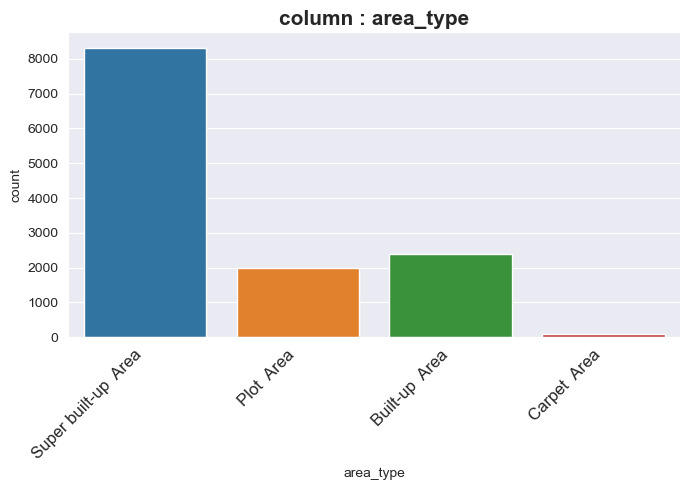

There is 0 NaN (0.0%)
There is 4 unique values
The most common value is Super built-up  Area , occurs 8317 times (65.02%)
area_type: is neither constant or a quasi-constant feauture and should be kept


In [16]:
explore_cat(df1,'area_type');

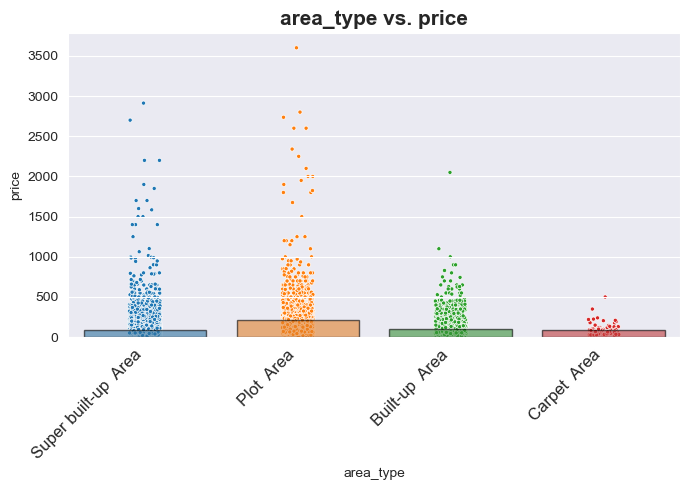

In [18]:
plot_cat_vs_target(df1,'area_type','price');

## Column : Availability

In [19]:
df1['availability'].value_counts()

Ready To Move           10172
18-May                    292
18-Dec                    284
18-Apr                    269
18-Aug                    187
19-Dec                    176
18-Jul                    131
18-Mar                    130
18-Jun                     98
20-Dec                     94
19-Mar                     85
21-Dec                     79
18-Feb                     62
18-Nov                     45
18-Jan                     43
18-Oct                     39
19-Jun                     35
19-Jul                     34
18-Sep                     33
19-Jan                     32
17-Dec                     29
17-Oct                     21
19-Sep                     20
22-Jun                     19
20-Jan                     18
19-Aug                     18
21-Jun                     17
Immediate Possession       16
20-Aug                     16
19-Apr                     16
21-Mar                     14
19-Oct                     14
17-Jun                     13
17-Jul    

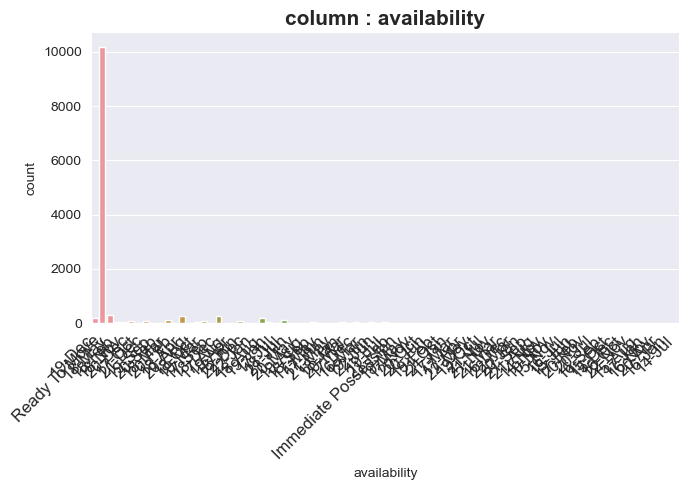

There is 0 NaN (0.0%)
There is 81 unique values
The most common value is Ready To Move , occurs 10172 times (79.52%)
availability: is neither constant or a quasi-constant feauture and should be kept


In [21]:
explore_cat(df1,'availability');

This columns contains a lot of unique values and it will be better for modeling if we drop it . 

## Column : Location

In [23]:
df1['location'].value_counts()

Whitefield                                            523
Sarjapur  Road                                        379
Electronic City                                       287
Kanakpura Road                                        249
Thanisandra                                           229
Yelahanka                                             210
Marathahalli                                          169
Hebbal                                                161
Raja Rajeshwari Nagar                                 159
Uttarahalli                                           157
Hennur Road                                           149
Bannerghatta Road                                     149
7th Phase JP Nagar                                    135
Electronic City Phase II                              128
Rajaji Nagar                                          107
Haralur Road                                          102
Bellandur                                              93
KR Puram      

In [26]:
def aggregate_locations(df, column_name, threshold=20):
    location_counts = df[column_name].value_counts()
    locations_to_replace = location_counts[location_counts < threshold].index
    df.loc[df[column_name].isin(locations_to_replace), column_name] = 'Others'    
    return df

df2 = aggregate_locations(df1, 'location', threshold=40)
df2

,area_type,availability,location,size,society,total_sqft,bath,balcony,price
0,Super built-up Area,19-Dec,Electronic City Phase II,2 BHK,Coomee,1056,2.0,1.0,39.070
1,Plot Area,Ready To Move,Others,4 Bedroom,Theanmp,2600,5.0,3.0,120.000
2,Built-up Area,Ready To Move,Uttarahalli,3 BHK,NaN,1440,2.0,3.0,62.000
3,Super built-up Area,Ready To Move,Others,3 BHK,Soiewre,1521,3.0,1.0,95.000
4,Super built-up Area,Ready To Move,Kothanur,2 BHK,NaN,1200,2.0,1.0,51.000
5,Super built-up Area,Ready To Move,Whitefield,2 BHK,DuenaTa,1170,2.0,1.0,38.000
6,Super built-up Area,18-May,Others,4 BHK,Jaades,2732,4.0,NaN,204.000
7,Super built-up Area,Ready To Move,Rajaji Nagar,4 BHK,Brway G,3300,4.0,NaN,600.000
8,Super built-up Area,Ready To Move,Marathahalli,3 BHK,NaN,1310,3.0,1.0,63.250
9,Plot Area,Ready To Move,Others,6 Bedroom,NaN,1020,6.0,NaN,370.000


## Column : Size

In [ ]:
df001 = df00.copy()

In [ ]:
df001['size'].isna().sum()

16

<ipython-input-6-e586939b7f9e>:9: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), fontsize = 12 , rotation = 45 , ha = 'right')


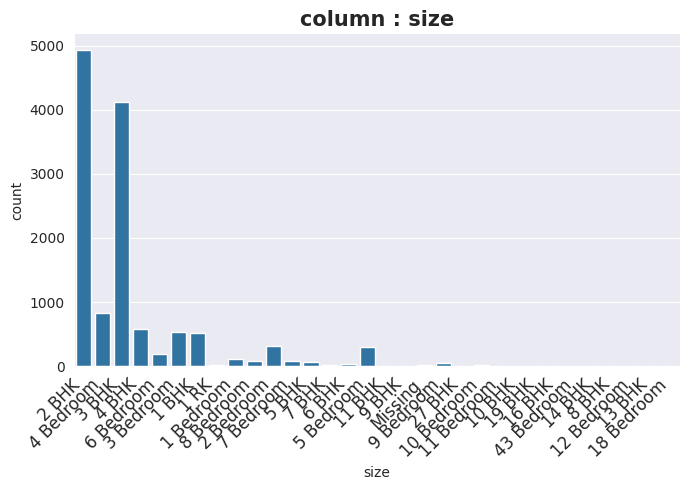

There is 16 NaN (0.13%)
There is 32 unique values
The most common value is 2 BHK , occurs 4931 times (38.55%)
size: is neither constant or a quasi-constant feauture and should be kept


In [ ]:
explore_cat(df001,'size');

In [ ]:
df001['size'].value_counts()

,count
size,
2 BHK,4931
3 BHK,4120
4 Bedroom,824
4 BHK,574
3 Bedroom,535
1 BHK,521
2 Bedroom,314
5 Bedroom,291
6 Bedroom,191


In [ ]:
# Since we have either bhk or bedrooms let's create 2 columns one with how many rooms there are
# and the other with whether the house has a hall or not .

def extract_features(size):
    try:
        size = str(size).lower()
        if 'bhk' in size:
            num_bedrooms = int(size.split(' ')[0])
            has_hall = 1
        elif 'bedroom' in size:
            num_bedrooms = int(size.split(' ')[0])
            has_hall = 0
        else:
            # Handle unexpected format by returning default values
            num_bedrooms = None
            has_hall = None
    except (ValueError, AttributeError, IndexError):
        num_bedrooms = None
        has_hall = None

    return num_bedrooms, has_hall

In [ ]:
df001.dtypes

,0
area_type,object
availability,object
location,object
size,object
society,object
total_sqft,object
bath,float64
balcony,float64
price,float64


In [ ]:
df1 = df001.copy()
df1[['bedrooms', 'has_hall']] = df1['size'].apply(lambda x: pd.Series(extract_features(x)))
df1.head(8)

,area_type,availability,location,size,society,total_sqft,bath,balcony,price,bedrooms,has_hall
0,Super built-up Area,19-Dec,Electronic City Phase II,2 BHK,Coomee,1056,2.0,1.0,39.07,2.0,1.0
1,Plot Area,Ready To Move,Chikka Tirupathi,4 Bedroom,Theanmp,2600,5.0,3.0,120.00,4.0,0.0
2,Built-up Area,Ready To Move,Uttarahalli,3 BHK,NaN,1440,2.0,3.0,62.00,3.0,1.0
3,Super built-up Area,Ready To Move,Lingadheeranahalli,3 BHK,Soiewre,1521,3.0,1.0,95.00,3.0,1.0
4,Super built-up Area,Ready To Move,Kothanur,2 BHK,NaN,1200,2.0,1.0,51.00,2.0,1.0
5,Super built-up Area,Ready To Move,Whitefield,2 BHK,DuenaTa,1170,2.0,1.0,38.00,2.0,1.0
6,Super built-up Area,18-May,Old Airport Road,4 BHK,Jaades,2732,4.0,NaN,204.00,4.0,1.0
7,Super built-up Area,Ready To Move,Rajaji Nagar,4 BHK,Brway G,3300,4.0,NaN,600.00,4.0,1.0


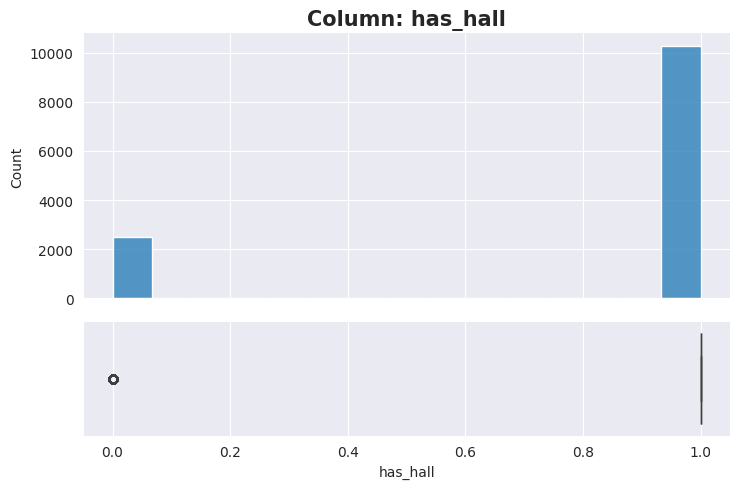

There are 29 NaN (0.23%)
There are 2 unique values
The most common value is 1.0, occurs 10274 times (80.32%)
has_hall: is neither constant nor a quasi-constant feature and should be kept


In [ ]:
explore_num(df1,'has_hall');

## Column : Society  

In [ ]:
df1['society'].isna().sum()

5328

In [ ]:
df1['society'].unique()

array(['Coomee ', 'Theanmp', nan, 'Soiewre', 'DuenaTa', 'Jaades ',
       'Brway G', 'Prrry M', 'Shncyes', 'Skityer', 'PrntaEn', 'Prityel',
       'GrrvaGr', 'PeBayle', 'She 2rk', 'Soitya ', 'Bhe 2ko', 'Itelaa ',
       'ViistLa', 'KBityo ', 'LedorSa', 'Mahosya', 'Kantsce', 'PrarePa',
       'Dieldli', 'Gentson', 'Soini T', 'Ceove G', 'Soazak ', 'LancyRe',
       'Goted U', 'Bhncyis', 'Rosha I', 'Suent V', 'RothaVa', 'NCowsar',
       'Dhalsh ', 'BrereAt', 'Laavevi', 'Chranya', 'HioraTr', 'BMineis',
       'Pruthg ', 'Sonosty', 'SNnia E', 'Anavi B', 'Viony H', 'AdentEl',
       'Gollela', 'Niareum', 'SJlynro', 'Tavenew', 'Srire S', 'Saenti ',
       'Bhmesy ', 'Goardth', 'IBityin', 'KHityry', 'BDensar', 'Makeser',
       'Maest N', 'Oznuean', 'Reeroce', 'Sonviik', 'DSgmax ', 'Cetattu',
       'Vaens G', 'Moity S', 'HiahsLa', 'SNontle', 'Sabixtt', 'Sragei ',
       'SyidaCr', 'Jahts H', 'Inensba', 'Srier P', 'Wiowsri', 'Derdsig',
       'Vaarech', 'TiaksAa', 'HMwerCo', 'ViensRK', 'Somum

## Column : Total sqft

In [ ]:
df1['total_sqft'].isna().sum()

0

In [ ]:
df1['total_sqft'].dtypes

dtype('O')

In [ ]:
df2 = df1.copy()

In [ ]:
def is_float(x):
    try:
        float(x)
    except:
        return False
    return True

In [ ]:
temp_df = df2[~df2['total_sqft'].apply(is_float)]

In [ ]:
temp_df['total_sqft'].unique()

array(['2100 - 2850', '3010 - 3410', '2957 - 3450', '3067 - 8156',
       '1042 - 1105', '1145 - 1340', '1015 - 1540', '1520 - 1740',
       '34.46Sq. Meter', '1195 - 1440', '1200 - 2400', '4125Perch',
       '1120 - 1145', '4400 - 6640', '3090 - 5002', '4400 - 6800',
       '1160 - 1195', '1000Sq. Meter', '4000 - 5249', '1115 - 1130',
       '1100Sq. Yards', '520 - 645', '1000 - 1285', '3606 - 5091',
       '650 - 665', '633 - 666', '5.31Acres', '30Acres', '1445 - 1455',
       '884 - 1116', '850 - 1093', '1440 - 1884', '716Sq. Meter',
       '547.34 - 827.31', '580 - 650', '3425 - 3435', '1804 - 2273',
       '3630 - 3800', '660 - 670', '1500Sq. Meter', '620 - 933',
       '142.61Sq. Meter', '2695 - 2940', '2000 - 5634', '1574Sq. Yards',
       '3450 - 3472', '1250 - 1305', '670 - 980', '1005.03 - 1252.49',
       '1004 - 1204', '361.33Sq. Yards', '645 - 936', '2710 - 3360',
       '2249.81 - 4112.19', '3436 - 3643', '2830 - 2882', '596 - 804',
       '1255 - 1863', '1300 - 1405', '1

In [ ]:
import re
# Define conversion factors
conversion_factors = {
    'sq. meter': 10.7639,
    'perch': 272.25,
    'acre': 43560,
    'guntha': 1089,
    'cent': 435.6,
    'ground': 2400,
    'sq. yard': 9,  # 1 sq. yard = 9 sq. ft.
}

def convert_to_sqft(value):
    # Regular expression pattern to extract numeric part and unit
    pattern = re.compile(r'(\d+\.?\d*)\s*(sq\. meter|perch|acre|guntha|cent|ground|sq\. yard)', re.IGNORECASE)
    match = pattern.search(value)

    if match:
        number = float(match.group(1))
        unit = match.group(2).lower()

        # Convert to square feet
        if unit in conversion_factors:
            return number * conversion_factors[unit]
        else:
            raise ValueError(f"Unknown unit: {unit}")
    else:
        raise ValueError(f"Invalid format: {value}")

def convert_sqft_to_num(value):
    # Handle ranges like "850 - 1060"
    if '-' in value or ' ' in value:
        # Remove any non-digit characters except '.' and '-'
        value = re.sub(r'[^\d.\-]', '', value)
        tokens = re.split(r'-', value)
        if len(tokens) == 2:
            try:
                return (float(tokens[0].strip()) + float(tokens[1].strip())) / 2
            except ValueError:
                raise ValueError(f"Invalid range format: {value}")
    else:
        # Handle direct conversion and unit conversions
        try:
            return float(value)
        except ValueError:
            return convert_to_sqft(value)

# Apply the conversion to the DataFrame using .apply()
df2['total_sqft'] = df2['total_sqft'].apply(lambda x: convert_sqft_to_num(x) if pd.notnull(x) else None)

print(df2)



                  area_type          availability  \
0      Super built-up  Area                19-Dec   
1                Plot  Area         Ready To Move   
2            Built-up  Area         Ready To Move   
3      Super built-up  Area         Ready To Move   
4      Super built-up  Area         Ready To Move   
5      Super built-up  Area         Ready To Move   
6      Super built-up  Area                18-May   
7      Super built-up  Area         Ready To Move   
8      Super built-up  Area         Ready To Move   
9                Plot  Area         Ready To Move   
10     Super built-up  Area                18-Feb   
11               Plot  Area         Ready To Move   
12     Super built-up  Area         Ready To Move   
13           Built-up  Area         Ready To Move   
14               Plot  Area         Ready To Move   
15     Super built-up  Area         Ready To Move   
16     Super built-up  Area         Ready To Move   
17     Super built-up  Area         Ready To M

In [ ]:
df22 = df2.copy()

In [ ]:
df22['total_sqft'] = df22['total_sqft'].astype(float)

In [ ]:
# Calculate price per square foot to eliminate later the outliers
df22['price_per_sqft'] = df22['price'] * 100000 / df22['total_sqft']

## Column : Bath

In [ ]:
df3 = df22.copy()

In [ ]:
df3['bath'].isna().sum()

73

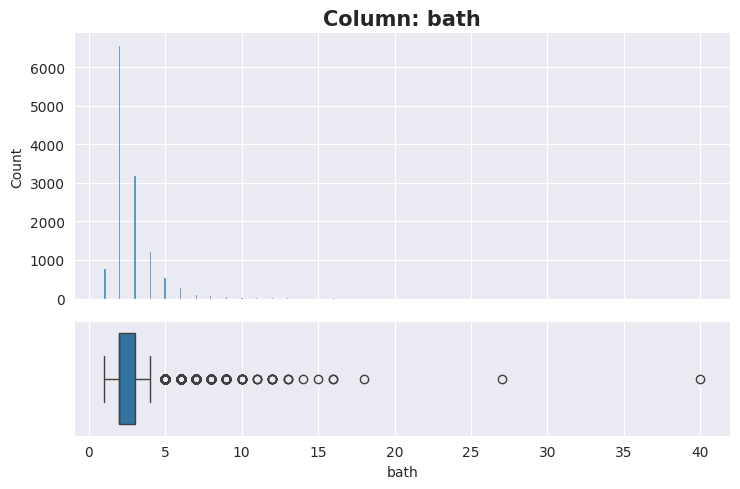

There are 73 NaN (0.57%)
There are 19 unique values
The most common value is 2.0, occurs 6546 times (51.18%)
bath: is neither constant nor a quasi-constant feature and should be kept


In [ ]:
explore_num(df3,'bath');

Since the distribution of the column bath is not normal distributed i'll use the median to impute the missing values

## Column : Balcony

In [ ]:
df3['balcony'].isna().sum()

605

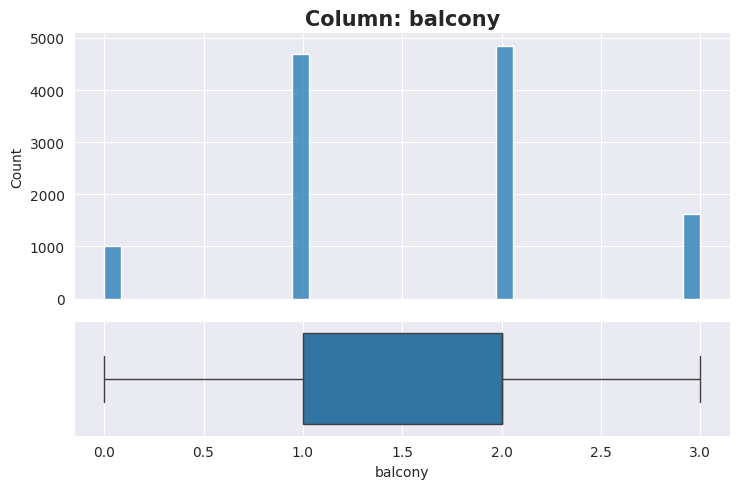

There are 605 NaN (4.73%)
There are 4 unique values
The most common value is 2.0, occurs 4846 times (37.89%)
balcony: is neither constant nor a quasi-constant feature and should be kept


In [ ]:
explore_num(df3,'balcony');

## Target : Price

In [ ]:
df3['price'].isna().sum()

0

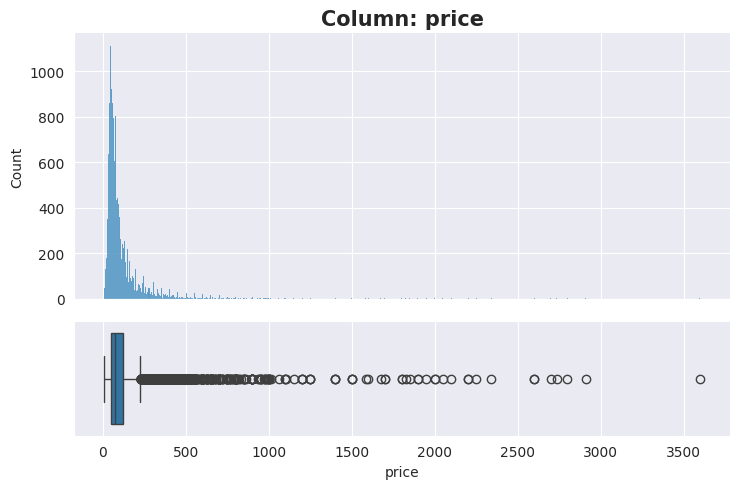

There are 0 NaN (0.0%)
There are 1994 unique values
The most common value is 75.0, occurs 300 times (2.35%)
price: is neither constant nor a quasi-constant feature and should be kept


In [ ]:
explore_num(df3,'price');

In [ ]:
target = df3['price']

<ipython-input-51-b1c8f1b2697c>:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(target,fit=stats.norm)
<ipython-input-51-b1c8f1b2697c>:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(np.log(target),fit=stats.norm)


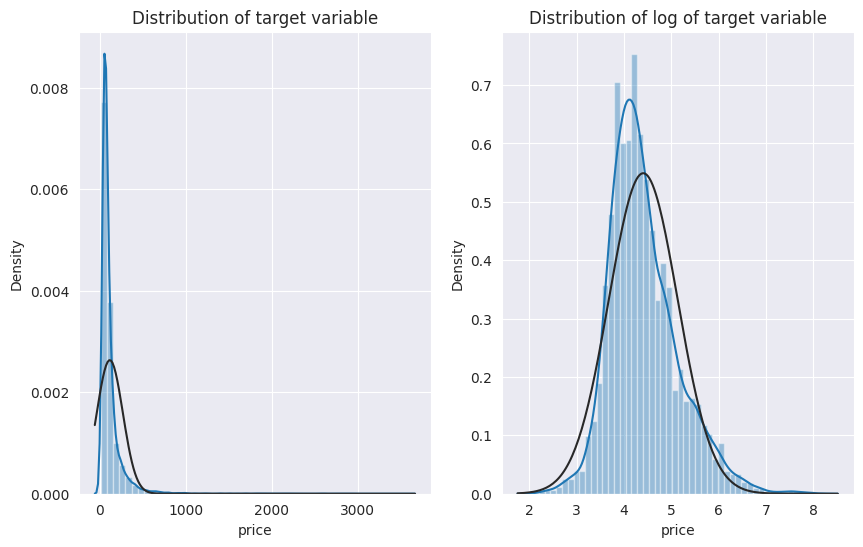

In [ ]:
plt.figure(figsize=(10,6))
plt.subplot(1,2,1)
sns.distplot(target,fit=stats.norm)
plt.title('Distribution of target variable')
plt.subplot(1,2,2)
sns.distplot(np.log(target),fit=stats.norm)
plt.title('Distribution of log of target variable')
plt.show()

# Data splitting

In [ ]:
# let's drop the unwanted columns :
df3.drop(['availability','society','size','has_hall'],axis=1,inplace=True)
df4 = df3.copy()

In [ ]:
X = df4.drop('price', axis=1)
y = df4['price'].apply(lambda x: np.log(x))
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=666)

# Cleaning the data

In [ ]:
X_train.isna().sum()

,0
area_type,0
location,0
total_sqft,26
bath,62
balcony,479
bedrooms,23
price_per_sqft,26


In [ ]:
X_test.isna().sum()

,0
area_type,0
location,0
total_sqft,6
bath,11
balcony,126
bedrooms,6
price_per_sqft,6


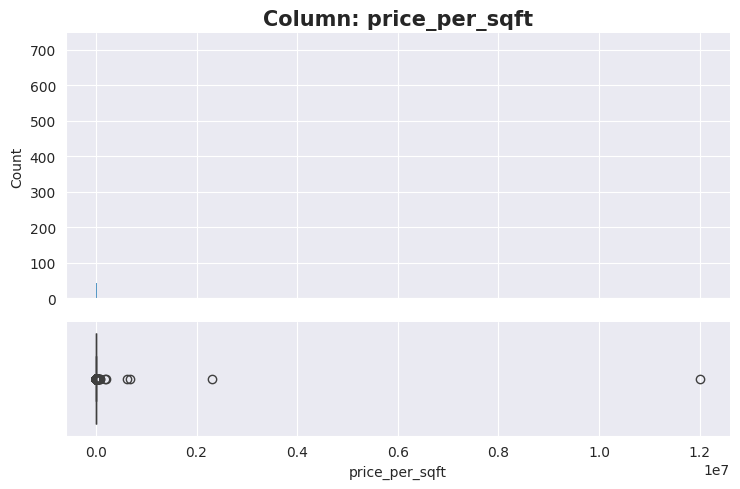

There are 26 NaN (0.25%)
There are 6317 unique values
The most common value is 5000.0, occurs 122 times (1.19%)
price_per_sqft: is neither constant nor a quasi-constant feature and should be kept


In [ ]:
explore_num(X_train,'price_per_sqft');

In [ ]:
def remove_outliers(df,column):
   mean = df[column].mean()
   std_dev = df[column].std()
   lower_bound = mean - 2 * std_dev
   upper_bound = mean + 2 * std_dev

    # Filter out outliers
   df_filtered = df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

   return df_filtered

In [ ]:
for i in X_train.select_dtypes('number').columns:
  X_train1 = remove_outliers(X_train,i)

In [ ]:
X_train1.isna().sum()

,0
area_type,0
location,0
total_sqft,0
bath,62
balcony,475
bedrooms,23
price_per_sqft,0


In [ ]:
for i in X_test.select_dtypes('number').columns:
  X_test1 = remove_outliers(X_test, i )

In [ ]:
X_test1.isna().sum()

,0
area_type,0
location,0
total_sqft,0
bath,11
balcony,119
bedrooms,6
price_per_sqft,0


In [ ]:
num_imputer= SimpleImputer(strategy='median')
to_impute = ['bath','bedrooms']
num_imputer.fit(X_train1[to_impute])
X_train1.loc[:, to_impute] = num_imputer.transform(X_train1[to_impute])

In [ ]:
X_test1.loc[:, to_impute] = num_imputer.transform(X_test1[to_impute])

In [ ]:
X_train2 = X_train1.copy()
X_test2 = X_test1.copy()

In [ ]:
X_train2.isna().sum()

,0
area_type,0
location,0
total_sqft,0
bath,0
balcony,475
bedrooms,0
price_per_sqft,0


In [ ]:
X_test2.isna().sum()

,0
area_type,0
location,0
total_sqft,0
bath,0
balcony,119
bedrooms,0
price_per_sqft,0


In [ ]:
X_train3 = X_train2.dropna(subset=['balcony'])
X_test3 = X_test2.dropna(subset=['balcony'])
train_indices = X_train3.index
test_indices = X_test3.index
y_train1 = y_train.loc[train_indices]
y_test1 = y_test.loc[test_indices]

In [ ]:
X_train3.isna().sum()

,0
area_type,0
location,0
total_sqft,0
bath,0
balcony,0
bedrooms,0
price_per_sqft,0


In [ ]:
X_test3.isna().sum()

,0
area_type,0
location,0
total_sqft,0
bath,0
balcony,0
bedrooms,0
price_per_sqft,0


In [ ]:
X_train3["area_type"].unique()

array(['Built-up  Area', 'Super built-up  Area', 'Plot  Area',
       'Carpet  Area'], dtype=object)

In [ ]:
X_train3

,area_type,location,total_sqft,bath,balcony,bedrooms,price_per_sqft
10235,Built-up Area,other,1000.000,2.0,0.0,2.0,5000.000000
11583,Super built-up Area,Bommanahalli,1355.000,2.0,0.0,2.0,5400.000000
5773,Super built-up Area,Haralur Road,2805.000,5.0,3.0,4.0,5704.099822
1024,Plot Area,1st Phase JP Nagar,1200.000,7.0,2.0,8.0,20000.000000
12512,Super built-up Area,CV Raman Nagar,1392.000,2.0,1.0,2.0,7902.298851
7014,Super built-up Area,other,4250.000,6.0,3.0,6.0,3529.411765
7698,Built-up Area,other,1205.000,2.0,1.0,2.0,5809.128631
10273,Super built-up Area,Dommasandra,674.000,1.0,1.0,2.0,2952.522255
5064,Super built-up Area,7th Phase JP Nagar,1050.000,2.0,1.0,2.0,4761.904762
11080,Super built-up Area,other,8321.000,5.0,2.0,4.0,34995.793775


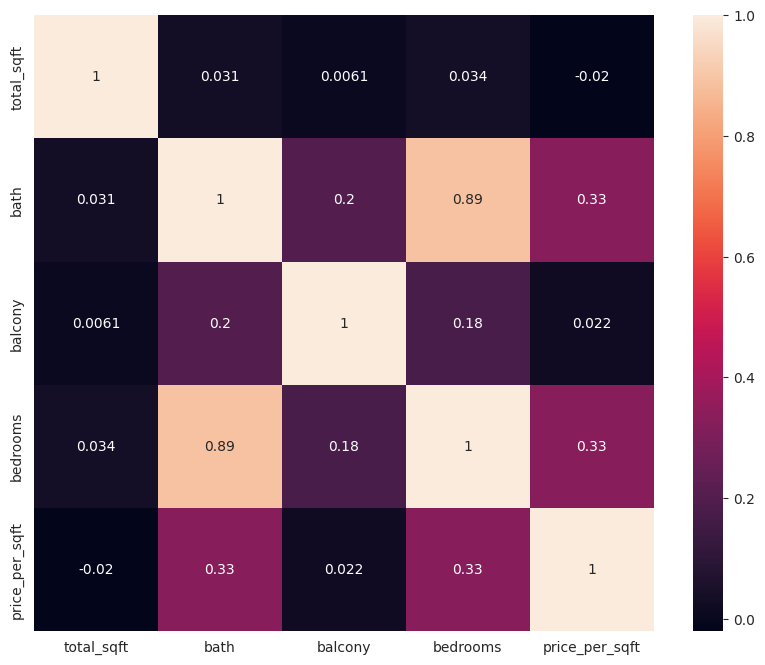

In [ ]:
corr = X_train3.select_dtypes('number').corr()
plt.figure(figsize=(10,8))
sns.heatmap(corr,annot=True);

In [ ]:
X_train4 = X_train3[X_train3['location'] != 'other']
X_test4 = X_test3[X_test3['location'] != 'other']

In [ ]:
X_train_clean = X_train4.drop(['area_type','price_per_sqft'],axis=1)
X_test_clean = X_test4.drop(['area_type','price_per_sqft'],axis=1)

# Finalize Preprocessing

In [ ]:
ohe = OneHotEncoder(handle_unknown='ignore',sparse_output=False)
scaler = StandardScaler()
transformer = ColumnTransformer([
    ('ohe',ohe,['location']),
    ('scaler',scaler,['total_sqft','bath','bedrooms','balcony'])],verbose_feature_names_out=False)


In [ ]:
X_train_processed = transformer.fit_transform(X_train_clean)
X_test_processed = transformer.transform(X_test_clean)

In [ ]:
scaler2 = StandardScaler()
pca95 = PCA(n_components=.95)
pca_pipe = make_pipeline(scaler2, pca95)
X_train_pca = pca_pipe.fit_transform(X_train_processed)
X_test_pca = pca_pipe.transform(X_test_processed)

In [ ]:
y_train1 = y_train.loc[X_train_pca.index]
y_test1 = y_test.loc[X_test_pca.index]

# Modeling : Deep Learning

In [ ]:
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense , Dropout , BatchNormalization

In [ ]:
def regression_metrics(y_true, y_pred, label='', verbose = True, output_dict=False):
  mae = mean_absolute_error(y_true, y_pred)
  mse = mean_squared_error(y_true, y_pred)
  rmse = mean_squared_error(y_true, y_pred, squared=False)
  r_squared = r2_score(y_true, y_pred)
  if verbose == True:
    header = "-"*60
    print(header, f"Regression Metrics: {label}", header, sep='\n')
    print(f"- MAE = {mae:,.3f}")
    print(f"- MSE = {mse:,.3f}")
    print(f"- RMSE = {rmse:,.3f}")
    print(f"- R^2 = {r_squared:,.3f}")
  if output_dict == True:
      metrics = {'Label':label, 'MAE':mae,
                 'MSE':mse, 'RMSE':rmse, 'R^2':r_squared}
      return metrics
def evaluate_regression (reg, X_train, y_train, X_test, y_test, verbose = True,
                        output_frame=False) :
   y_train_pred = reg.predict(X_train)
   results_train = regression_metrics(y_train, y_train_pred, verbose = verbose,
                                     output_dict=output_frame,
                                     label='Training Data')
   y_test_pred = reg.predict(X_test)
   results_test = regression_metrics(y_test, y_test_pred, verbose = verbose,
                                  output_dict=output_frame,
                                    label='Test Data' )
   if output_frame:
    results_df = pd.DataFrame([results_train,results_test])
    results_df = results_df.set_index('Label')
    results_df.index.name=None
    return results_df.round(3)


In [ ]:
model = tf.keras.Sequential()
model.add(Dense(1024, activation='relu', input_shape=(X_train_processed.shape[1],)))
model.add(Dense(512, activation='relu'))
model.add(Dense(256, activation='relu'))
model.add(Dense(128, activation='relu'))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae'])

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
history = model.fit(X_train_processed, y_train1,
                        validation_data = (X_test_processed, y_test1),
                        epochs=100)

Epoch 1/100
236/236 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - loss: 3.6331 - mae: 1.0778 - val_loss: 0.1923 - val_mae: 0.3209
Epoch 2/100
236/236 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.2368 - mae: 0.3233 - val_loss: 0.1521 - val_mae: 0.2913
Epoch 3/100
236/236 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.1617 - mae: 0.2780 - val_loss: 0.1459 - val_mae: 0.2834
Epoch 4/100
236/236 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.1227 - mae: 0.2674 - val_loss: 0.2269 - val_mae: 0.3837
Epoch 5/100
236/236 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.1647 - mae: 0.2949 - val_loss: 0.1473 - val_mae: 0.2834
Epoch 6/100
236/236 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.1105 - mae: 0.2508 - val_loss: 0.1277 - val_mae: 0.2739
Epoch 7/100
236/236 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.1119 - mae: 0.2452 - val_loss: 0.1290 - val_mae: 0.2736
Epoch 8/100
236/236 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0942 - mae: 0.2311 - val_loss: 0.1303 - val_mae: 0.2740
Epoch 9/100
236/236 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms

In [ ]:
def plot_history(history, figsize=(6,12), marker='o'):

    # Get list of metrics from history
    metrics = [c for c in history.history if not c.startswith('val_')]

    ## Separate row for each metric
    fig, axes = plt.subplots(nrows=len(metrics),figsize=figsize)

    # For each metric
    for i, metric_name in enumerate(metrics):

        # Get the axis for the current metric
        ax = axes[i]

        # Get metric from history.history
        metric_values = history.history[metric_name]
        # Get epochs from history
        epochs = history.epoch

        # Plot the training metric
        ax.plot(epochs, metric_values, label=metric_name, marker=marker)

        ## Check if val_{metric} exists. if so, plot:
        val_metric_name = f"val_{metric_name}"
        if val_metric_name in history.history:
            # Get validation values and plot
            metric_values = history.history[val_metric_name]
            ax.plot(epochs,metric_values,label=val_metric_name, marker=marker)

        # Final subplot adjustments
        ax.legend()
        ax.set_title(metric_name)
    fig.tight_layout()

    return fig, axes

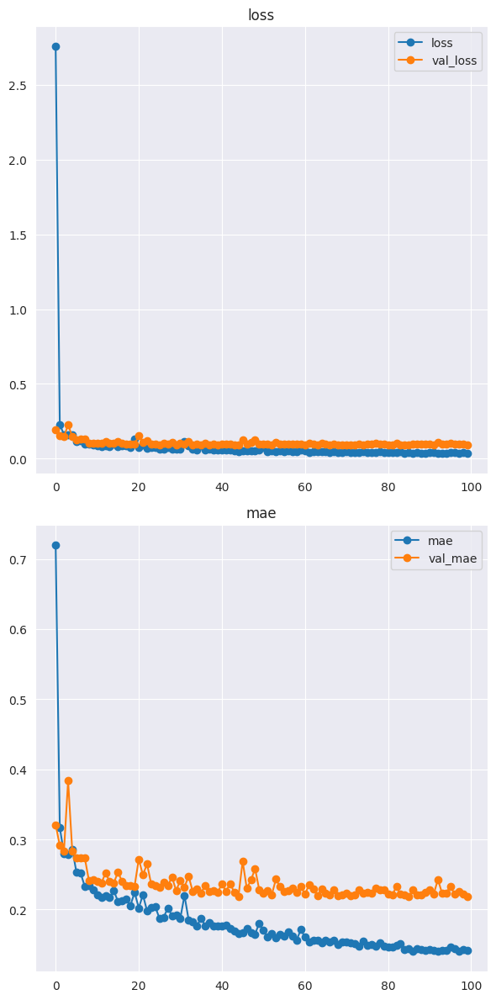

In [ ]:
plot_history(history);

In [ ]:
y_pred = model.predict(X_test_processed)

print(f'final RMSE: {np.sqrt(mean_squared_error(y_test1, y_pred))}')
print(f'final MAE: {mean_absolute_error(y_test1, y_pred)}')
print(f'final R2: {r2_score(y_test1, y_pred)}')

59/59 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step
final RMSE: 0.3038607600113375
final MAE: 0.21835062114916
final R2: 0.7927524356070388


### let's try the same model on the data after PCA :


In [ ]:
modelpca = tf.keras.Sequential()
modelpca.add(Dense(1024, activation='relu', input_shape=(X_train_pca.shape[1],)))
modelpca.add(Dense(512, activation='relu'))
modelpca.add(Dense(256, activation='relu'))
modelpca.add(Dense(128, activation='relu'))
modelpca.add(Dense(1))
modelpca.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae'])

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
history_pca = modelpca.fit(X_train_pca, y_train1,
                        validation_data = (X_test_pca, y_test1),
                        epochs=100)

Epoch 1/100
236/236 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - loss: 1.9037 - mae: 0.9057 - val_loss: 0.4990 - val_mae: 0.5188
Epoch 2/100
236/236 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.4458 - mae: 0.4900 - val_loss: 0.3062 - val_mae: 0.3723
Epoch 3/100
236/236 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.2683 - mae: 0.3787 - val_loss: 0.2570 - val_mae: 0.3692
Epoch 4/100
236/236 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.2270 - mae: 0.3494 - val_loss: 0.2566 - val_mae: 0.3606
Epoch 5/100
236/236 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.2479 - mae: 0.3657 - val_loss: 0.2321 - val_mae: 0.3518
Epoch 6/100
236/236 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.2211 - mae: 0.3516 - val_loss: 0.2336 - val_mae: 0.3540
Epoch 7/100
236/236 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.2082 - mae: 0.3411 - val_loss: 0.2335 - val_mae: 0.3529
Epoch 8/100
236/236 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.2213 - mae: 0.3508 - val_loss: 0.1951 - val_mae: 0.3211
Epoch 9/100
236/236 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms

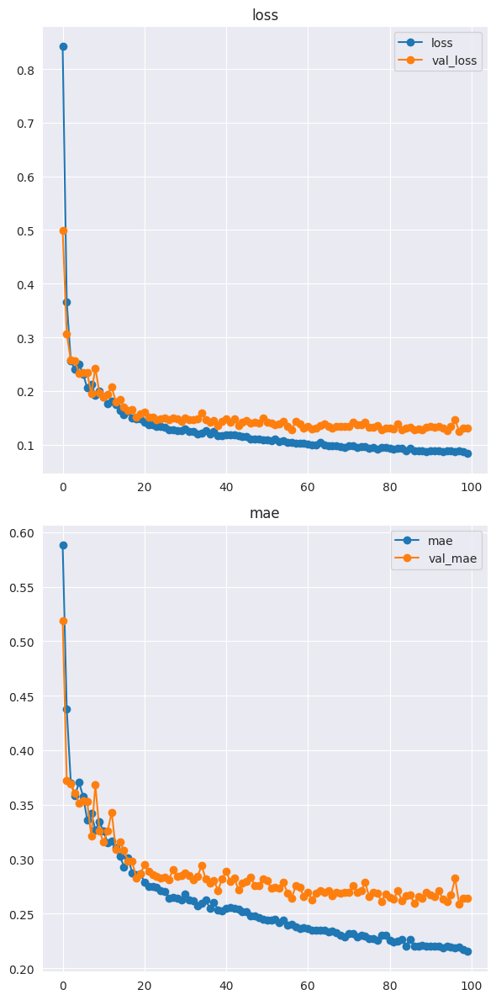

In [ ]:
plot_history(history_pca);

In [ ]:
y_pred_pca = modelpca.predict(X_test_pca)

print(f'final RMSE: {np.sqrt(mean_squared_error(y_test1, y_pred_pca))}')
print(f'final MAE: {mean_absolute_error(y_test1, y_pred_pca)}')
print(f'final R2: {r2_score(y_test1, y_pred_pca)}')

59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
final RMSE: 0.3611204880661366
final MAE: 0.2646087455619363
final R2: 0.7072853537959176


The processed data had given us better results than the PCA data , let's try and tune our model

In [ ]:
model1 = tf.keras.Sequential()
model1.add(Dense(1024, activation='relu', input_shape=(X_train_processed.shape[1],)))
model1.add(Dense(512, activation='relu'))
model1.add(Dropout(.2))
model1.add(Dense(256, activation='relu'))
model1.add(Dropout(.2))
model1.add(Dense(128, activation='relu'))
model1.add(Dense(1))
model1.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae'])

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
history1 = model1.fit(X_train_processed, y_train1,
                        validation_data = (X_test_processed, y_test1),
                        epochs=100)

Epoch 1/100
236/236 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 7.5436 - mae: 1.2226 - val_loss: 0.8379 - val_mae: 0.6250
Epoch 2/100
236/236 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 1.0014 - mae: 0.5541 - val_loss: 0.4341 - val_mae: 0.4468
Epoch 3/100
236/236 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.2578 - mae: 0.3881 - val_loss: 0.3055 - val_mae: 0.4425
Epoch 4/100
236/236 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.1987 - mae: 0.3418 - val_loss: 0.2495 - val_mae: 0.3930
Epoch 5/100
236/236 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.1865 - mae: 0.3327 - val_loss: 0.2536 - val_mae: 0.3989
Epoch 6/100
236/236 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.1612 - mae: 0.3085 - val_loss: 0.2187 - val_mae: 0.3657
Epoch 7/100
236/236 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.1500 - mae: 0.3012 - val_loss: 0.1527 - val_mae: 0.2979
Epoch 8/100
236/236 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.1378 - mae: 0.2882 - val_loss: 0.3981 - val_mae: 0.5396
Epoch 9/100
236/236 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms

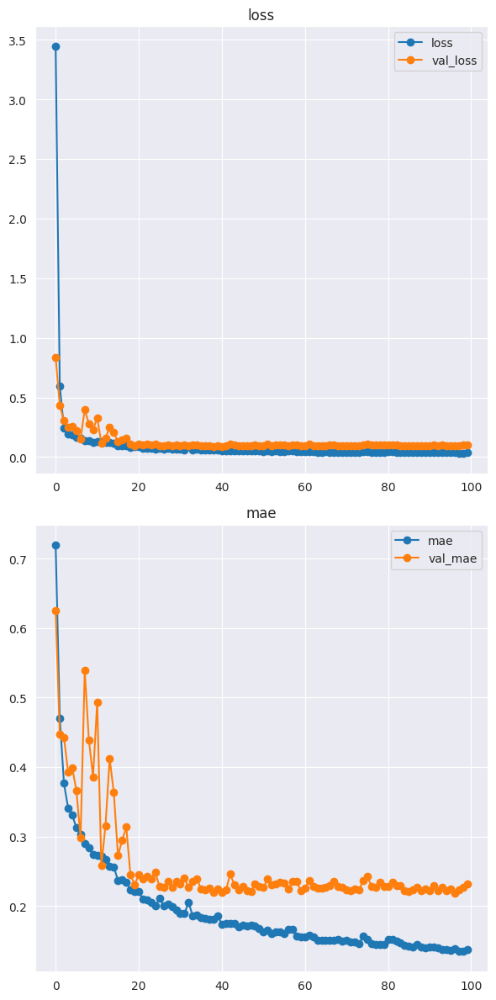

In [ ]:
plot_history(history1);

In [ ]:
y_pred1 = model1.predict(X_test_processed)

print(f'final RMSE: {np.sqrt(mean_squared_error(y_test1, y_pred1))}')
print(f'final MAE: {mean_absolute_error(y_test1, y_pred1)}')
print(f'final R2: {r2_score(y_test1, y_pred1)}')

59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
final RMSE: 0.3193417774714795
final MAE: 0.2312070140863795
final R2: 0.7710969010142744


In [ ]:
model2 = tf.keras.Sequential()
model2.add(Dense(1024, activation='relu', input_shape=(X_train_processed.shape[1],)))
model2.add(Dense(512, activation='relu'))
model2.add(Dropout(.2))
model2.add(BatchNormalization())
model2.add(Dense(256, activation='relu'))
model2.add(Dense(128, activation='relu'))
model2.add(Dropout(.2))
model2.add(BatchNormalization())
model2.add(Dense(64, activation='relu'))
model2.add(Dense(32, activation='relu'))
model2.add(Dense(1))
model2.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae'])

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
history2 = model2.fit(X_train_processed, y_train1,
                        validation_data = (X_test_processed, y_test1),
                        epochs=100)

Epoch 1/100
236/236 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 5.8182 - mae: 1.6774 - val_loss: 0.6083 - val_mae: 0.5579
Epoch 2/100
236/236 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3064 - mae: 0.4251 - val_loss: 0.2497 - val_mae: 0.3994
Epoch 3/100
236/236 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.2399 - mae: 0.3780 - val_loss: 0.1626 - val_mae: 0.3073
Epoch 4/100
236/236 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.1975 - mae: 0.3458 - val_loss: 0.1631 - val_mae: 0.3004
Epoch 5/100
236/236 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.1775 - mae: 0.3236 - val_loss: 0.1532 - val_mae: 0.3034
Epoch 6/100
236/236 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.1509 - mae: 0.3000 - val_loss: 0.1467 - val_mae: 0.2861
Epoch 7/100
236/236 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.1587 - mae: 0.3098 - val_loss: 0.1204 - val_mae: 0.2665
Epoch 8/100
236/236 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.1416 - mae: 0.2965 - val_loss: 0.1561 - val_mae: 0.3035
Epoch 9/100
236/236 ━━━━━━━━━━━━━━━━━━━━ 1s 5m

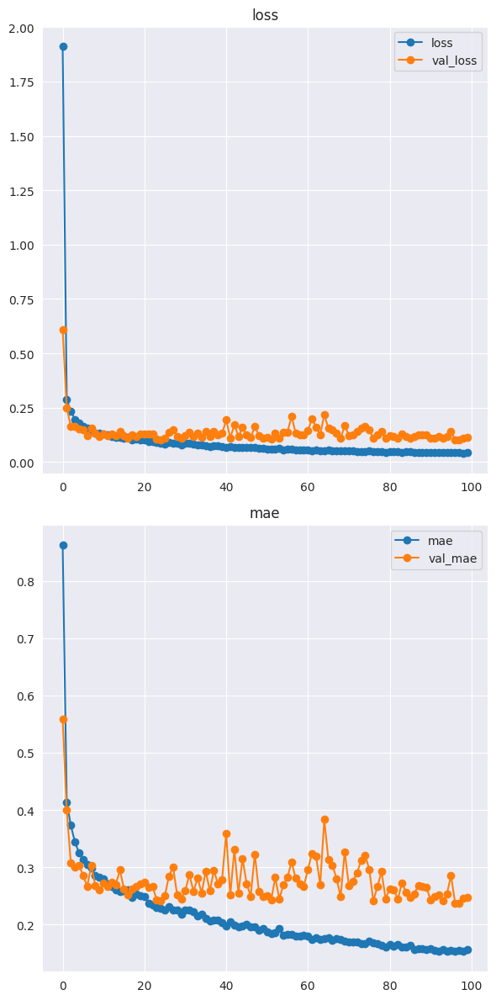

In [ ]:
plot_history(history2);

In [ ]:
y_pred2 = model2.predict(X_test_processed)

print(f'final RMSE: {np.sqrt(mean_squared_error(y_test1, y_pred2))}')
print(f'final MAE: {mean_absolute_error(y_test1, y_pred2)}')
print(f'final R2: {r2_score(y_test1, y_pred2)}')

59/59 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step
final RMSE: 0.335669269745495
final MAE: 0.24766671540117804
final R2: 0.7470915363607898


In [ ]:
model3 = tf.keras.Sequential()
model3.add(Dense(2000, activation='relu', input_shape=(X_train_processed.shape[1],)))
model.add(Dense(1000,activation='relu'))
model3.add(Dense(500, activation='relu'))
model3.add(Dense(125, activation='relu'))
model3.add(Dense(60, activation='relu'))
model3.add(Dense(20, activation='relu'))
model3.add(Dense(1, activation='linear'))
model3.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae'])

In [ ]:
history3 = model3.fit(X_train_processed, y_train1,
                        validation_data = (X_test_processed, y_test1),
                        epochs=100)

Epoch 1/100
236/236 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - loss: 11.0640 - mae: 1.2137 - val_loss: 0.2060 - val_mae: 0.3401
Epoch 2/100
236/236 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 1.4656 - mae: 0.3952 - val_loss: 0.5078 - val_mae: 0.5952
Epoch 3/100
236/236 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.2680 - mae: 0.3718 - val_loss: 0.1657 - val_mae: 0.2987
Epoch 4/100
236/236 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.1838 - mae: 0.2983 - val_loss: 0.1491 - val_mae: 0.2857
Epoch 5/100
236/236 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.1410 - mae: 0.2792 - val_loss: 0.1434 - val_mae: 0.2775
Epoch 6/100
236/236 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.1271 - mae: 0.2676 - val_loss: 0.1420 - val_mae: 0.2831
Epoch 7/100
236/236 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.1275 - mae: 0.2653 - val_loss: 0.1448 - val_mae: 0.2871
Epoch 8/100
236/236 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.1247 - mae: 0.2639 - val_loss: 0.1234 - val_mae: 0.2652
Epoch 9/100
236/236 ━━━━━━━━━━━━━━━━━━━━ 1s 3m

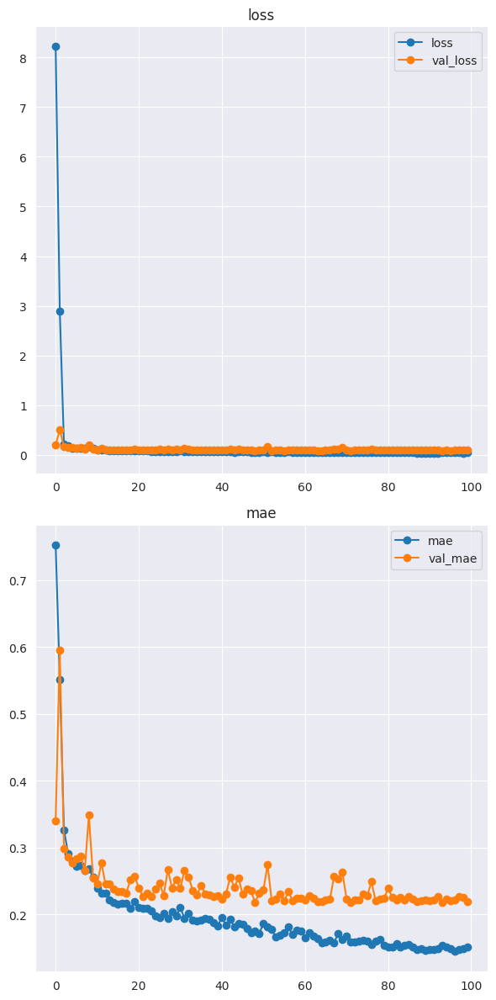

In [ ]:
plot_history(history3);

In [ ]:
y_pred3 = model3.predict(X_test_processed)

print(f'final RMSE: {np.sqrt(mean_squared_error(y_test1, y_pred3))}')
print(f'final MAE: {mean_absolute_error(y_test1, y_pred3)}')
print(f'final R2: {r2_score(y_test1, y_pred3)}')

59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
final RMSE: 0.30440556936402874
final MAE: 0.21926653490026674
final R2: 0.7920085973228856


## After Tunining the model , we'll go with the first model since it's the most efficient compared to the other two models